# SyriaTel Customer Churn Prediction

<img src="https://media.licdn.com/dms/image/v2/D4D12AQHKngXPBveV4Q/article-cover_image-shrink_423_752/article-cover_image-shrink_423_752/0/1713714133204?e=1745452800&v=beta&t=63s-HDsaqx6ZcP9a6kRcnEm0d-cWlkXzGF2hpKunzZw" alt="Image Description" width="900" height="auto">

# Business Understanding

## Problem Statement  
SyriaTel, a leading telecommunications company, faces a major challenge: **customer churn**. Customers leaving the network results in revenue loss and increased costs to acquire new users. To maintain profitability and customer loyalty, SyriaTel needs a reliable way to **predict which customers are likely to churn** and take proactive retention measures.

## Stakeholders  
The following groups will benefit from this project:

- **Business Executives**
  - Need insights to **reduce customer churn** and improve revenue.
  
- **Marketing Team** 
  - Uses churn predictions for **personalized retention campaigns**.

- **Customer Service** 
  - Can reach out to **at-risk customers proactively**.
  
- **Sales and Product Teams**
  - Can improve service offerings **based on churn patterns**.

## Project Objective  
The goal of this project is to **build a Classification model** to **predict** whether customers are at risk of churning based on their **call usage, account features, and service complaints**. SyriaTel can then implement **targeted retention strategies**, such as offering discounts or improving service.
  
## Key Business Questions:

- **What are the key factors that contribute to customer churn?**

- **Can we predict which customers are likely to churn?**

- **What interventions can be implemented to reduce churn?**

- **How can the model's insights inform marketing and customer service strategies?**.

# Data Understanding  

## 1. Data Source  
The dataset used for this project is the **SyriaTel Customer Churn Dataset**, which contains customer data from SyriaTel, a telecommunications company. It includes various customer-related features such as call minutes, and customer service calls, which are crucial for predicting whether a customer will churn.  

## 2. Why This Data is Useful  
The dataset is well-suited for solving our business problem because it contains key indicators of customer behavior. The features present in the dataset allow us to analyze customer interactions with SyriaTel’s services and detect patterns that lead to customer churn. Predicting churn can help SyriaTel improve customer retention strategies.

## 3. Dataset Overview

In [1]:
# Import Libraries Required
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot space as inline for inline plots and qt for external plots
%matplotlib inline

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.simplefilter("ignore")

In [2]:
# Loading dataset
# Read the dataset using with open
with open("bigml.csv") as f:
    df =pd.read_csv(f)

In [3]:
# Inspect the first few rows
df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [4]:
# Checking the columns
df.columns

Index(['state', 'account length', 'area code', 'phone number',
       'international plan', 'voice mail plan', 'number vmail messages',
       'total day minutes', 'total day calls', 'total day charge',
       'total eve minutes', 'total eve calls', 'total eve charge',
       'total night minutes', 'total night calls', 'total night charge',
       'total intl minutes', 'total intl calls', 'total intl charge',
       'customer service calls', 'churn'],
      dtype='object')

In [5]:
#checking the dataset shape
df.shape

(3333, 21)

In [6]:
# Check column names and data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

In [7]:
# Get summary statistics for numeric columns
df.describe()

,account length,area code,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [8]:
df.isna().sum()

state                     0
account length            0
area code                 0
phone number              0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64

In [9]:
df.duplicated

<bound method DataFrame.duplicated of      state  account length  area code phone number international plan  \
0       KS             128        415     382-4657                 no   
1       OH             107        415     371-7191                 no   
2       NJ             137        415     358-1921                 no   
3       OH              84        408     375-9999                yes   
4       OK              75        415     330-6626                yes   
...    ...             ...        ...          ...                ...   
3328    AZ             192        415     414-4276                 no   
3329    WV              68        415     370-3271                 no   
3330    RI              28        510     328-8230                 no   
3331    CT             184        510     364-6381                yes   
3332    TN              74        415     400-4344                 no   

     voice mail plan  number vmail messages  total day minutes  \
0                ye

In [10]:
# check for unique values in each column

for column in df:
  unique_values = df[column].unique()
  print(f"Unique values in column '{column}','\n': {unique_values}",'\n')

Unique values in column 'state','
': ['KS' 'OH' 'NJ' 'OK' 'AL' 'MA' 'MO' 'LA' 'WV' 'IN' 'RI' 'IA' 'MT' 'NY'
 'ID' 'VT' 'VA' 'TX' 'FL' 'CO' 'AZ' 'SC' 'NE' 'WY' 'HI' 'IL' 'NH' 'GA'
 'AK' 'MD' 'AR' 'WI' 'OR' 'MI' 'DE' 'UT' 'CA' 'MN' 'SD' 'NC' 'WA' 'NM'
 'NV' 'DC' 'KY' 'ME' 'MS' 'TN' 'PA' 'CT' 'ND'] 

Unique values in column 'account length','
': [128 107 137  84  75 118 121 147 117 141  65  74 168  95  62 161  85  93
  76  73  77 130 111 132 174  57  54  20  49 142 172  12  72  36  78 136
 149  98 135  34 160  64  59 119  97  52  60  10  96  87  81  68 125 116
  38  40  43 113 126 150 138 162  90  50  82 144  46  70  55 106  94 155
  80 104  99 120 108 122 157 103  63 112  41 193  61  92 131 163  91 127
 110 140  83 145  56 151 139   6 115 146 185 148  32  25 179  67  19 170
 164  51 208  53 105  66  86  35  88 123  45 100 215  22  33 114  24 101
 143  48  71 167  89 199 166 158 196 209  16  39 173 129  44  79  31 124
  37 159 194 154  21 133 224  58  11 109 102 165  18  30 176  47 190 15

In [11]:
# Check unique values for categorical columns
df['international plan'].unique()

array(['no', 'yes'], dtype=object)

In [12]:
# Calculate the average account length
average_account_length = df['account length'].mean()
print(f"Average Account Length: {average_account_length:.2f} months")

Average Account Length: 101.06 months


## 4. Data Summary
The dataset contains **3333 rows and 21 columns**. Below are the key statistics:

- The average account length is **101.06 months**.
- Customers who have made more service calls tend to churn more frequently.
- The dataset contains both **categorical and numerical features**, such as:
- 1. Account Length (Numerical): Duration a customer has been with SyriaTel.
- 2. International Plan (Categorical): Whether the customer has an international plan.
- 3. Customer Service Calls (Numerical): Number of times a customer called support.
- 4. Churn (Target Variable): 1 indicates churn, 0 indicates retention.

Detailed Data Structure:
- 1. Total rows: **3333**
- 2. Total columns: **21**

Columns: The dataset includes both **numerical and categorical features**:
- 1. Numerical features (e.g., account length, customer service calls, total day minutes, etc.)
- 2. Categorical features (e.g., state, international plan, voice mail plan)

Data Types:

- 1. Numerical: **8 columns** (e.g., account length, customer service calls, etc.)
- 2. Categorical: **4 columns** (e.g., state, international plan, etc.)
- 3. Boolean: **1 column** (churn)

## 5. Data Limitations
While the dataset is useful for churn prediction, it has some limitations:

1. **Lack of Demographic Information**: The dataset does not include demographic details such as age, income, or geographic location, which could provide additional insights into customer behavior and churn.

2. **Missing Explicit Reasons for Churn**: We do not have explicit reasons for why a customer churned (e.g., pricing, network issues, customer service dissatisfaction), which could help improve the model's predictive power.

3. **Representativeness**: The dataset may not be fully representative of all SyriaTel customers. It may only cover a certain subset, potentially leading to issues with model generalizability when applied to a broader customer base.

# Data Preparation

## 1. Data cleaning

In [13]:
df.isna().sum()

state                     0
account length            0
area code                 0
phone number              0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64

In [14]:
df.columns

Index(['state', 'account length', 'area code', 'phone number',
       'international plan', 'voice mail plan', 'number vmail messages',
       'total day minutes', 'total day calls', 'total day charge',
       'total eve minutes', 'total eve calls', 'total eve charge',
       'total night minutes', 'total night calls', 'total night charge',
       'total intl minutes', 'total intl calls', 'total intl charge',
       'customer service calls', 'churn'],
      dtype='object')

In [15]:
# Change columns name to lower case for uniformity
# Removing the white space if any
df.columns = df.columns.str.lower().str.replace(' ', '_')

In [16]:
df.columns = df.columns.str.strip().str.lower()

In [17]:
# Remove in the entire datafram 
df = df.map(lambda x: x.strip() if isinstance(x, str) else x)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account_length          3333 non-null   int64  
 2   area_code               3333 non-null   int64  
 3   phone_number            3333 non-null   object 
 4   international_plan      3333 non-null   object 
 5   voice_mail_plan         3333 non-null   object 
 6   number_vmail_messages   3333 non-null   int64  
 7   total_day_minutes       3333 non-null   float64
 8   total_day_calls         3333 non-null   int64  
 9   total_day_charge        3333 non-null   float64
 10  total_eve_minutes       3333 non-null   float64
 11  total_eve_calls         3333 non-null   int64  
 12  total_eve_charge        3333 non-null   float64
 13  total_night_minutes     3333 non-null   float64
 14  total_night_calls       3333 non-null   

In [18]:
df.columns

Index(['state', 'account_length', 'area_code', 'phone_number',
       'international_plan', 'voice_mail_plan', 'number_vmail_messages',
       'total_day_minutes', 'total_day_calls', 'total_day_charge',
       'total_eve_minutes', 'total_eve_calls', 'total_eve_charge',
       'total_night_minutes', 'total_night_calls', 'total_night_charge',
       'total_intl_minutes', 'total_intl_calls', 'total_intl_charge',
       'customer_service_calls', 'churn'],
      dtype='object')

In [19]:
# Remove in the entire datafram 
df = df.map(lambda x: x.strip() if isinstance(x, str) else x)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account_length          3333 non-null   int64  
 2   area_code               3333 non-null   int64  
 3   phone_number            3333 non-null   object 
 4   international_plan      3333 non-null   object 
 5   voice_mail_plan         3333 non-null   object 
 6   number_vmail_messages   3333 non-null   int64  
 7   total_day_minutes       3333 non-null   float64
 8   total_day_calls         3333 non-null   int64  
 9   total_day_charge        3333 non-null   float64
 10  total_eve_minutes       3333 non-null   float64
 11  total_eve_calls         3333 non-null   int64  
 12  total_eve_charge        3333 non-null   float64
 13  total_night_minutes     3333 non-null   float64
 14  total_night_calls       3333 non-null   

## 2. Data Preprocessing

In [20]:
# Importing the libraries needed
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score
from sklearn.feature_selection import SelectKBest
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.tree import plot_tree

**Since we are dealing with Classification problem, convert Categorical Variables:**

Columns like **'international plan' and 'voice mail plan'** are binary, so they are mapped to 0 and 1 using map().
The  **'state' column** is a categorical variable with **multiple categories**, so we use One-Hot Encoding via pd.get_dummies() to create binary columns for each state.

In [21]:
df.isna().sum()

state                     0
account_length            0
area_code                 0
phone_number              0
international_plan        0
voice_mail_plan           0
number_vmail_messages     0
total_day_minutes         0
total_day_calls           0
total_day_charge          0
total_eve_minutes         0
total_eve_calls           0
total_eve_charge          0
total_night_minutes       0
total_night_calls         0
total_night_charge        0
total_intl_minutes        0
total_intl_calls          0
total_intl_charge         0
customer_service_calls    0
churn                     0
dtype: int64

In [22]:
print("Shape of df before dropping columns:", df.shape)

Shape of df before dropping columns: (3333, 21)


In [23]:
print("Summary statistics:\n", df.describe())

Summary statistics:
        account_length    area_code  number_vmail_messages  total_day_minutes  \
count     3333.000000  3333.000000            3333.000000        3333.000000   
mean       101.064806   437.182418               8.099010         179.775098   
std         39.822106    42.371290              13.688365          54.467389   
min          1.000000   408.000000               0.000000           0.000000   
25%         74.000000   408.000000               0.000000         143.700000   
50%        101.000000   415.000000               0.000000         179.400000   
75%        127.000000   510.000000              20.000000         216.400000   
max        243.000000   510.000000              51.000000         350.800000   

       total_day_calls  total_day_charge  total_eve_minutes  total_eve_calls  \
count      3333.000000       3333.000000        3333.000000      3333.000000   
mean        100.435644         30.562307         200.980348       100.114311   
std          20.06

In [24]:
print("Columns before dropping:\n", df.columns)


Columns before dropping:
 Index(['state', 'account_length', 'area_code', 'phone_number',
       'international_plan', 'voice_mail_plan', 'number_vmail_messages',
       'total_day_minutes', 'total_day_calls', 'total_day_charge',
       'total_eve_minutes', 'total_eve_calls', 'total_eve_charge',
       'total_night_minutes', 'total_night_calls', 'total_night_charge',
       'total_intl_minutes', 'total_intl_calls', 'total_intl_charge',
       'customer_service_calls', 'churn'],
      dtype='object')


In [25]:
print(df.dtypes)

state                      object
account_length              int64
area_code                   int64
phone_number               object
international_plan         object
voice_mail_plan            object
number_vmail_messages       int64
total_day_minutes         float64
total_day_calls             int64
total_day_charge          float64
total_eve_minutes         float64
total_eve_calls             int64
total_eve_charge          float64
total_night_minutes       float64
total_night_calls           int64
total_night_charge        float64
total_intl_minutes        float64
total_intl_calls            int64
total_intl_charge         float64
customer_service_calls      int64
churn                        bool
dtype: object


In [26]:
correlation_matrix = df.select_dtypes(include=['number', 'bool']).corr()
df = df.drop(columns=['phone_number'])  # Remove unique identifier
df_encoded = pd.get_dummies(df, drop_first=True)
correlation_matrix = df_encoded.corr()
print("Correlation matrix with encoded categorical variables:\n", correlation_matrix)

Correlation matrix with encoded categorical variables:
                         account_length  area_code  number_vmail_messages  \
account_length                1.000000  -0.012463              -0.004628   
area_code                    -0.012463   1.000000              -0.001994   
number_vmail_messages        -0.004628  -0.001994               1.000000   
total_day_minutes             0.006216  -0.008264               0.000778   
total_day_calls               0.038470  -0.009646              -0.009548   
...                                ...        ...                    ...   
state_WI                     -0.008476   0.005189               0.002070   
state_WV                     -0.025631   0.029812               0.008308   
state_WY                      0.018058  -0.001039              -0.017748   
international_plan_yes        0.024735   0.048551               0.008745   
voice_mail_plan_yes           0.002918  -0.000747               0.956927   

                        total_d

#### Key Observations from the Correlation Matrix
**1. Highly Correlated Features**
total_day_minutes and total_day_charge (Correlation = 1.000000)

These variables are perfectly correlated because total_day_charge is likely calculated from total_day_minutes using a fixed rate.
This suggests redundancy, meaning one of these columns can be removed to avoid multicollinearity in modeling.
voice_mail_plan_yes and number_vmail_messages (Correlation = 0.956927)

Customers with a voicemail plan tend to have a high number of voicemail messages.
This strong correlation suggests that having a voicemail plan directly impacts the number of voicemail messages received.

**2. Weak or No Correlation**
Most of the correlations between state_* variables and other numerical variables are close to zero.

This suggests that the state a customer lives in does not significantly influence other attributes like call duration, data usage, or churn.
account_length shows weak correlations with most variables.

This means that the length of time a customer has had their account does not strongly influence other behaviors like call minutes or churn.
**3. international_plan_yes and Other Variables**
international_plan_yes has a weak positive correlation with total_day_minutes (0.049396)

Customers with an international plan may have slightly higher call minutes, but the correlation is weak.
This means that just having an international plan does not necessarily indicate more call usage.

Very weak correlation with churn

If included, we would expect international_plan_yes to show a slight correlation with churn, as customers with international plans may have different cancellation behaviors.

In [27]:
# Convert categorical variables to numerical representations via encoding
# Convert binary categorical variables ('international plan', 'voice mail plan') to numerical format (0 and 1)
df['international_plan'] = df['international_plan'].map({'yes': 1, 'no': 0})

df['voice_mail_plan'] = df['voice_mail_plan'].map({'yes': 1, 'no': 0})

# One-hot encode multi-category variables (if needed)
df = pd.get_dummies(df, columns=['state'], drop_first=True)  
    
# Check data types after encoding
print(df.dtypes)

account_length           int64
area_code                int64
international_plan       int64
voice_mail_plan          int64
number_vmail_messages    int64
                         ...  
state_VT                  bool
state_WA                  bool
state_WI                  bool
state_WV                  bool
state_WY                  bool
Length: 69, dtype: object


In [28]:
print(df['international_plan'].value_counts())

international_plan
0    3010
1     323
Name: count, dtype: int64


In [29]:
# Standardize or normalize numerical features
# Identify numerical columns
numerical_columns = ['account_length', 'number_vmail_messages', 'total_day_minutes', 'total_day_calls', 
                     'total_day_charge', 'total_eve_minutes', 'total_eve_calls', 'total_eve_charge', 
                     'total_night_minutes', 'total_night_calls', 'total_night_charge', 
                     'total_intl_minutes', 'total_intl_calls', 'total_intl_charge', 'customer_service_calls']

# Select only numerical columns from the DataFrame
numerical_data = df[numerical_columns]  # Extract numerical features

scaler = MinMaxScaler()
df[numerical_columns] = scaler.fit_transform(df[numerical_columns])

# Check the first few rows
print(df.head())  # Now df contains the standardized values


   account_length  area_code  international_plan  voice_mail_plan  \
0        0.524793        415                   0                1   
1        0.438017        415                   0                1   
2        0.561983        415                   0                0   
3        0.342975        408                   1                0   
4        0.305785        415                   1                0   

   number_vmail_messages  total_day_minutes  total_day_calls  \
0               0.490196           0.755701         0.666667   
1               0.509804           0.460661         0.745455   
2               0.000000           0.693843         0.690909   
3               0.000000           0.853478         0.430303   
4               0.000000           0.475200         0.684848   

   total_day_charge  total_eve_minutes  total_eve_calls  ...  state_SD  \
0          0.755701           0.542755         0.582353  ...     False   
1          0.460597           0.537531         0.605

In [30]:
# Check if the result is empty
print(df[numerical_columns].head())  # Should not be empty if there are numeric columns

   account_length  number_vmail_messages  total_day_minutes  total_day_calls  \
0        0.524793               0.490196           0.755701         0.666667   
1        0.438017               0.509804           0.460661         0.745455   
2        0.561983               0.000000           0.693843         0.690909   
3        0.342975               0.000000           0.853478         0.430303   
4        0.305785               0.000000           0.475200         0.684848   

   total_day_charge  total_eve_minutes  total_eve_calls  total_eve_charge  \
0          0.755701           0.542755         0.582353          0.542866   
1          0.460597           0.537531         0.605882          0.537690   
2          0.693830           0.333242         0.647059          0.333225   
3          0.853454           0.170195         0.517647          0.170171   
4          0.475184           0.407754         0.717647          0.407959   

   total_night_minutes  total_night_calls  total_night_c

In [31]:
df.columns

Index(['account_length', 'area_code', 'international_plan', 'voice_mail_plan',
       'number_vmail_messages', 'total_day_minutes', 'total_day_calls',
       'total_day_charge', 'total_eve_minutes', 'total_eve_calls',
       'total_eve_charge', 'total_night_minutes', 'total_night_calls',
       'total_night_charge', 'total_intl_minutes', 'total_intl_calls',
       'total_intl_charge', 'customer_service_calls', 'churn', 'state_AL',
       'state_AR', 'state_AZ', 'state_CA', 'state_CO', 'state_CT', 'state_DC',
       'state_DE', 'state_FL', 'state_GA', 'state_HI', 'state_IA', 'state_ID',
       'state_IL', 'state_IN', 'state_KS', 'state_KY', 'state_LA', 'state_MA',
       'state_MD', 'state_ME', 'state_MI', 'state_MN', 'state_MO', 'state_MS',
       'state_MT', 'state_NC', 'state_ND', 'state_NE', 'state_NH', 'state_NJ',
       'state_NM', 'state_NV', 'state_NY', 'state_OH', 'state_OK', 'state_OR',
       'state_PA', 'state_RI', 'state_SC', 'state_SD', 'state_TN', 'state_TX',
       'stat

In [32]:
df.shape

(3333, 69)

In [33]:
df.isna().sum()

account_length           0
area_code                0
international_plan       0
voice_mail_plan          0
number_vmail_messages    0
                        ..
state_VT                 0
state_WA                 0
state_WI                 0
state_WV                 0
state_WY                 0
Length: 69, dtype: int64

## 3. Exploratory Data Analysis (EDA)
In this section, we analyze the dataset to understand its distribution, relationships, and patterns.  
We divide EDA into three parts:
- **Univariate Analysis** (Single Variable)
- **Bivariate Analysis** (Two Variables)
- **Multivariate Analysis** (Multiple Variables)


### 3.1. Univariate Analysis

### 3.1.0. Numerical Features (Distribution & Outliers)
Use histograms and boxplots to visualize distributions.

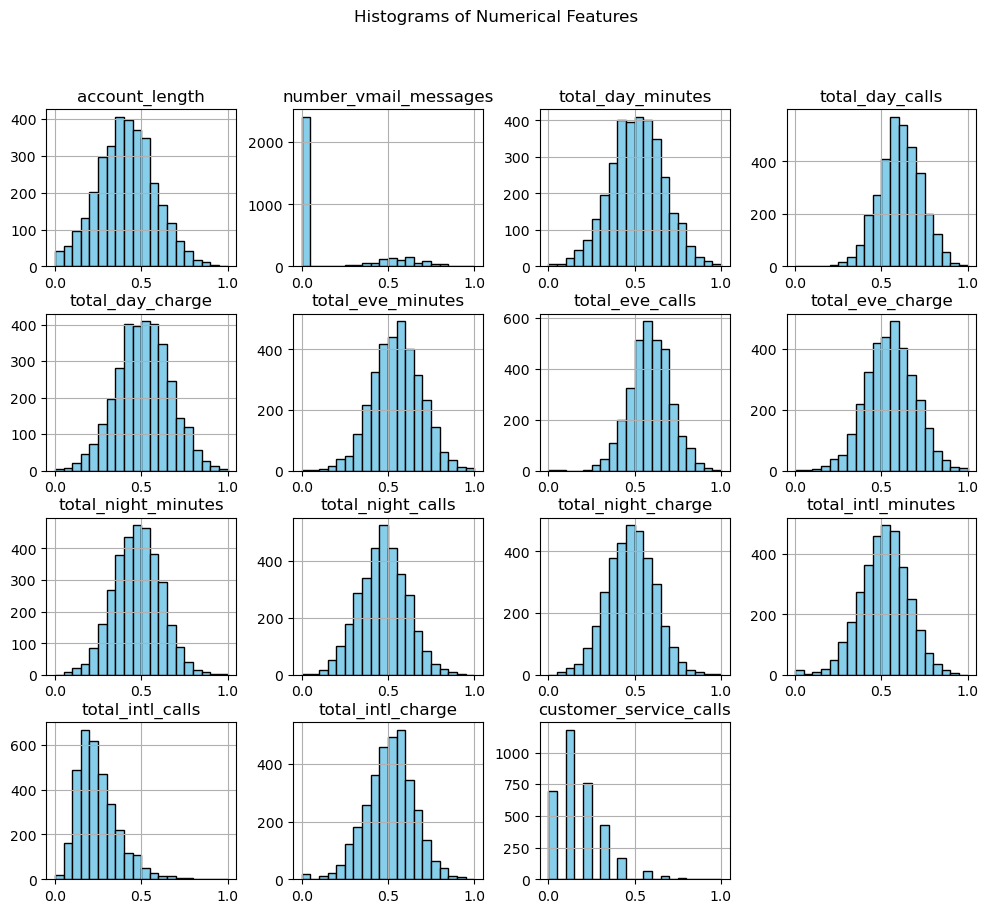

In [34]:
# Histograms for numerical columns
df[numerical_columns].hist(figsize=(12, 10), bins=20, color="skyblue", edgecolor="black")
plt.suptitle("Histograms of Numerical Features")
plt.show()

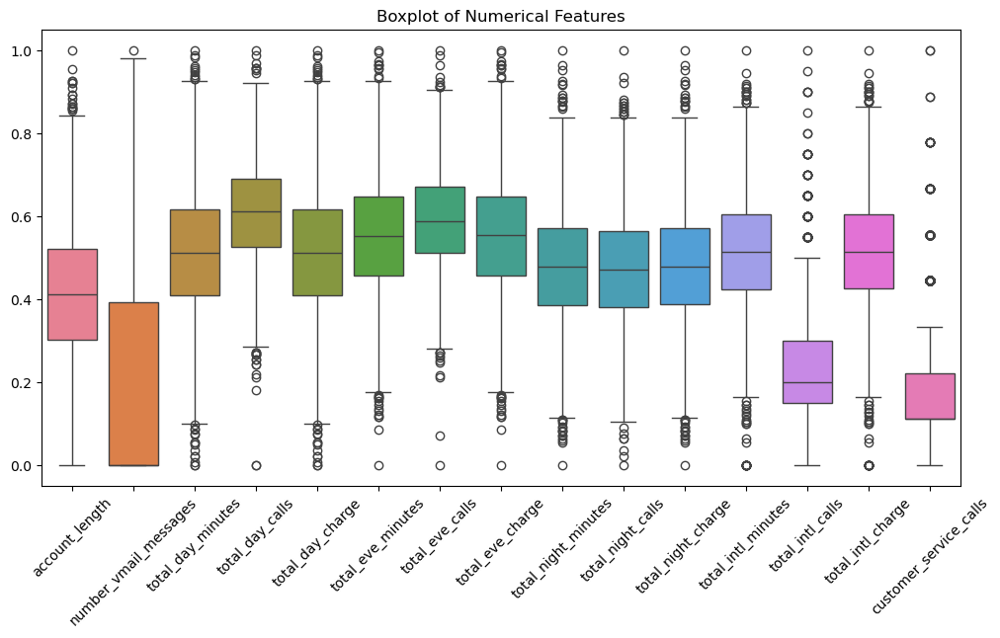

In [35]:
# Boxplots to detect outliers
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[numerical_columns])
plt.xticks(rotation=45)
plt.title("Boxplot of Numerical Features")
plt.show()

### 3.1.1. Categorical Features (Value Counts)
Since churn, international_plan, and voice_mail_plan are categorical, check their distribution.

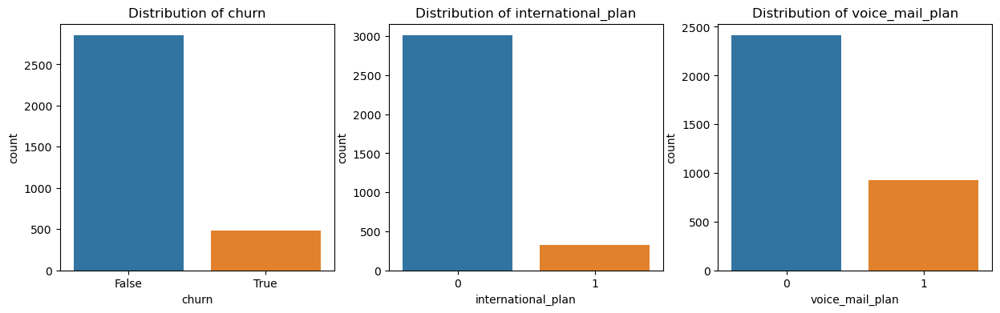

In [36]:
# Countplot for categorical variables
categorical_columns = ['churn', 'international_plan', 'voice_mail_plan']
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for i, col in enumerate(categorical_columns):
    sns.countplot(x=df[col], ax=axes[i], palette="tab10")
    axes[i].set_title(f"Distribution of {col}")

plt.show()

### 3.1.2. Checking Class Distribution

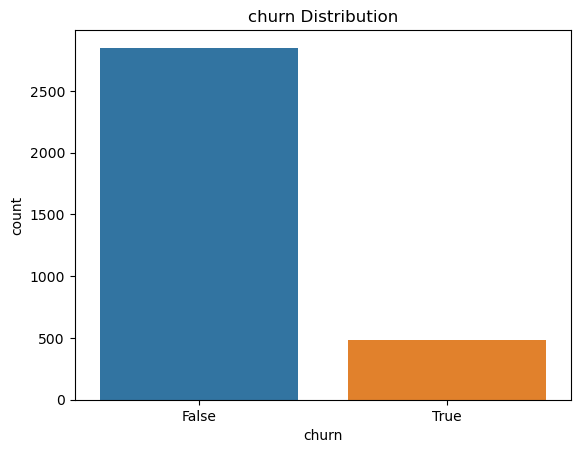

churn
False    85.508551
True     14.491449
Name: proportion, dtype: float64

In [37]:
# Check target variable distribution
sns.countplot(x=df["churn"], palette="tab10")
plt.title("churn Distribution")
plt.show()

# Percentage of Churn
df["churn"].value_counts(normalize=True) * 100


### 3.2. Bivariate Analysis (Relationships Between Two Features)
**1. Relationship Between Churn and Categorical Variables**

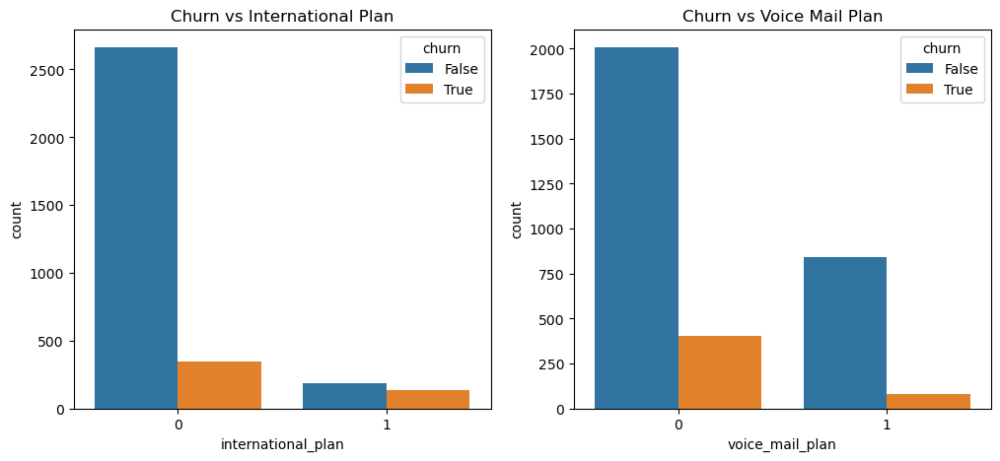

In [38]:
# Countplot of churn vs categorical variables
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.countplot(x='international_plan', hue='churn', data=df, ax=axes[0], palette="tab10")
axes[0].set_title("Churn vs International Plan")

sns.countplot(x='voice_mail_plan', hue='churn', data=df, ax=axes[1], palette="tab10")
axes[1].set_title("Churn vs Voice Mail Plan")

plt.show()

**2. Relationship Between Churn and Numerical Features**

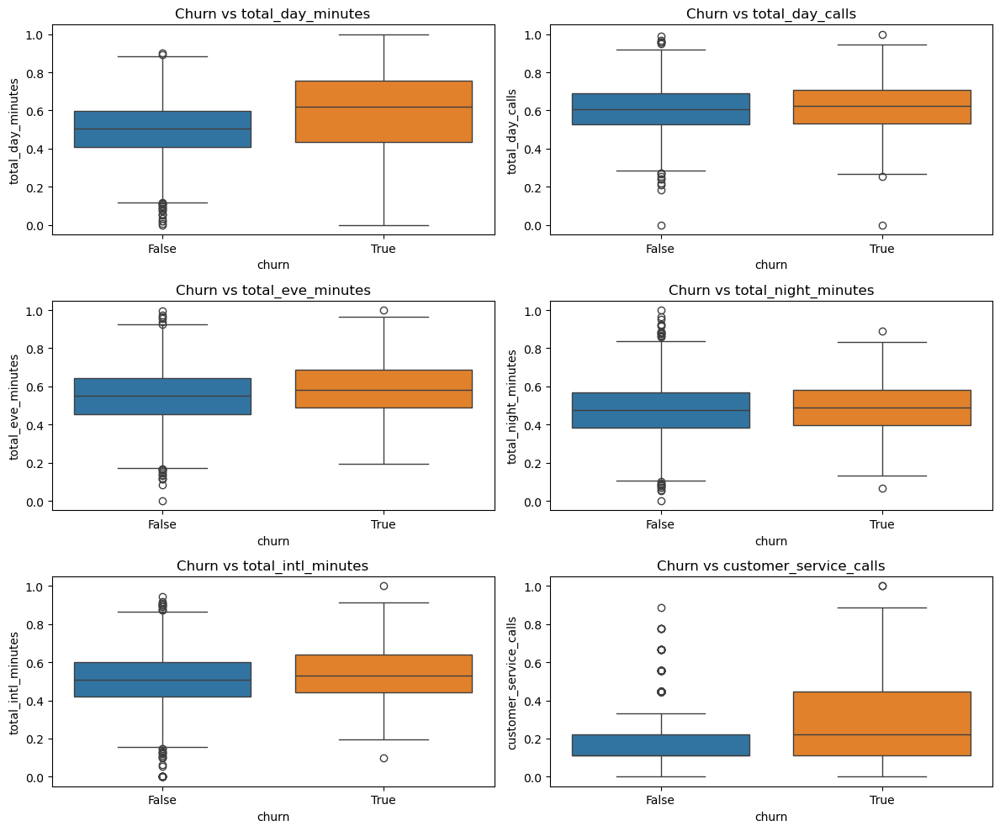

In [39]:
# Boxplots of numerical features vs churn
fig, axes = plt.subplots(3, 2, figsize=(12, 10))

numerical_features = ['total_day_minutes', 'total_day_calls', 'total_eve_minutes', 
                      'total_night_minutes', 'total_intl_minutes', 'customer_service_calls']

for i, col in enumerate(numerical_features):
    sns.boxplot(x='churn', y=col, data=df, ax=axes[i//2, i%2], palette="tab10")
    axes[i//2, i%2].set_title(f"Churn vs {col}")

plt.tight_layout()
plt.show()

In [40]:
# Define the numerical features to clean
numerical_features = ['total_day_minutes', 'total_day_calls', 'total_eve_minutes', 
                      'total_night_minutes', 'total_intl_minutes', 'customer_service_calls']

# Remove outliers for each feature
for col in numerical_features:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

# Check the shape of the dataset after removal
print(df.shape)


(2926, 69)


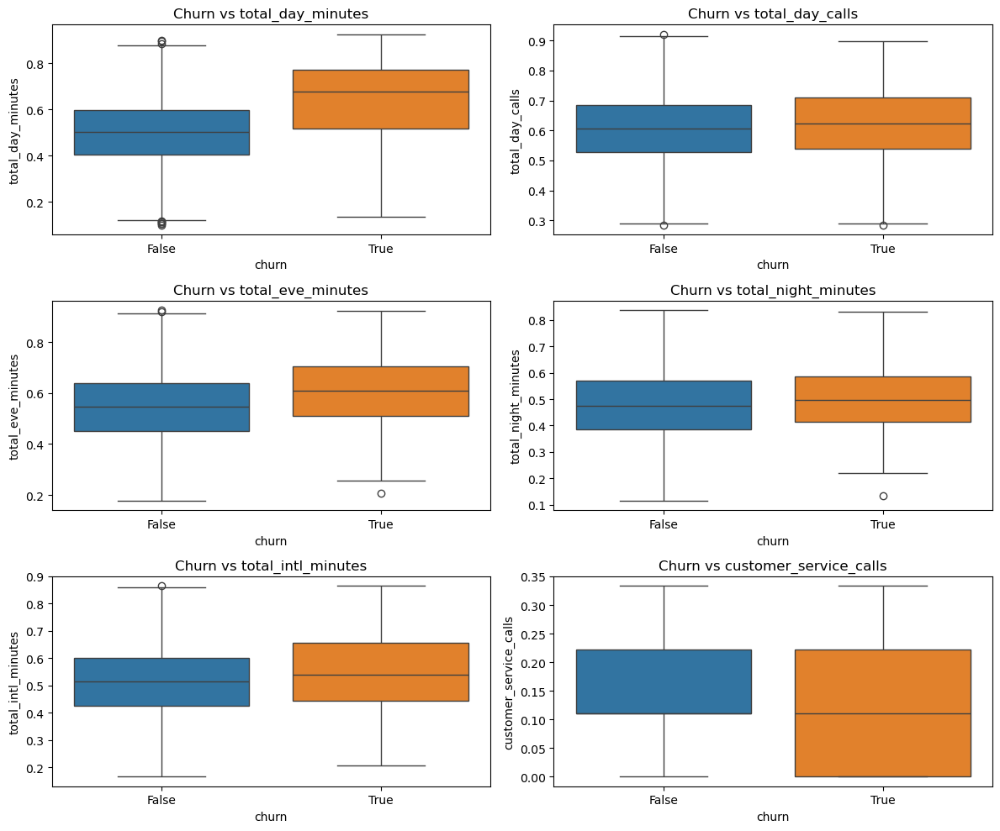

In [41]:
# Boxplots of numerical features vs churn
fig, axes = plt.subplots(3, 2, figsize=(12, 10))

numerical_features = ['total_day_minutes', 'total_day_calls', 'total_eve_minutes', 
                      'total_night_minutes', 'total_intl_minutes', 'customer_service_calls']

for i, col in enumerate(numerical_features):
    sns.boxplot(x='churn', y=col, data=df, ax=axes[i//2, i%2], palette="tab10")
    axes[i//2, i%2].set_title(f"Churn vs {col}")

plt.tight_layout()
plt.show()

In [42]:
# Saving the cleaned dataset
df.to_csv("tableau_df.csv", index=False)

### 3.3. Multivariate Analysis (Relationships Between Multiple Features)
**1. Correlation Heatmap**

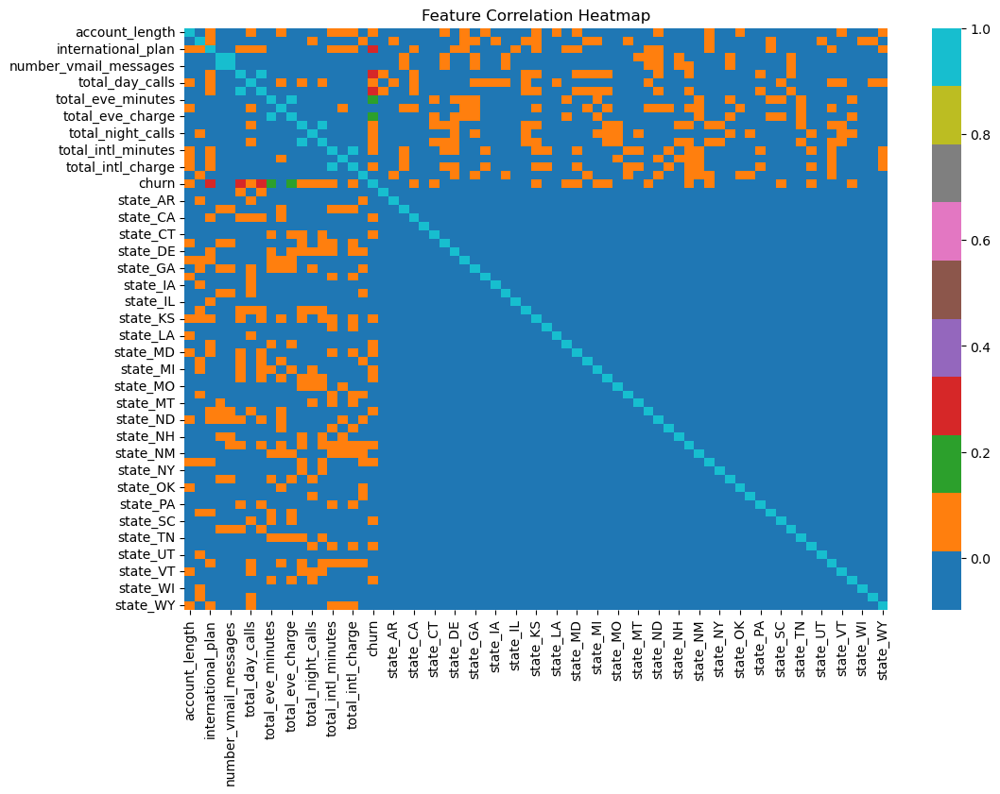

In [43]:
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), cmap="tab10", annot=False)
plt.title("Feature Correlation Heatmap")
plt.show()

#### Key Observations
**- Diagonal Line (Light Blue)**

The diagonal represents self-correlation (each variable compared to itself), which is always 1.

**Highly Correlated Features (Light Blue Clusters)**

Some features have very strong correlations (values close to 1), such as:
- total_eve_minutes and total_eve_charge
- total_day_minutes and total_day_charge
- total_night_minutes and total_night_charge
- total_intl_minutes and total_intl_charge
This indicates redundancy— we can remove one feature from each of these pairs to avoid multicollinearity in modeling.

**Sparse Correlations with state Variables**

The orange-colored cells show weak correlations between state variables and numerical features.
This suggests that state does not strongly influence customer behavior.
These categorical variables (one-hot encoded states) might not be very useful for predicting churn.

**churn Correlations**

The correlation of churn with other features is not very strong (not much light blue near churn).
This suggests that churn depends on multiple factors rather than a single highly correlated variable.

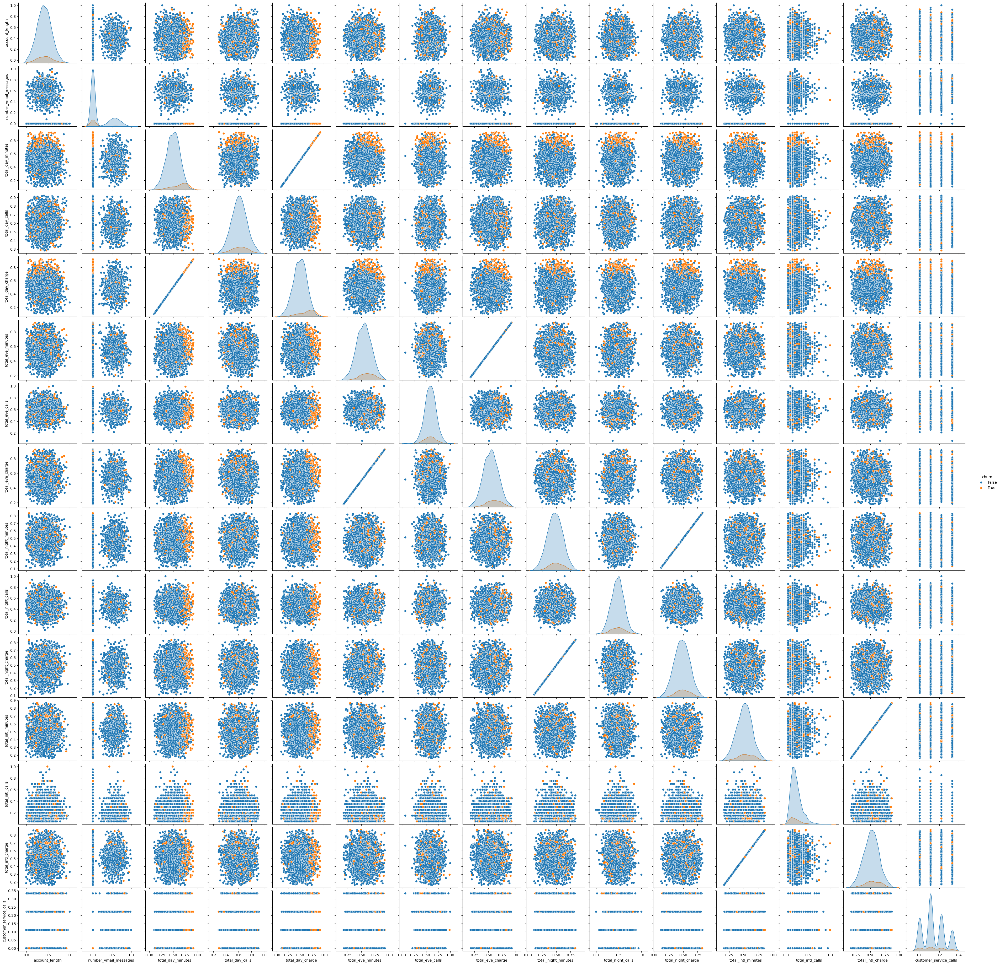

In [44]:
sns.pairplot(df[numerical_columns + ['churn']], hue='churn', palette="tab10")
plt.show()

## 4. Feature Engineering

**4.1.0. Creating New Features**

In [45]:
# Creating new features
df["voicemail_usage_intensity"] = df["number_vmail_messages"] / (df["account_length"] + 1)
df["day_call_duration"] = df["total_day_minutes"] / (df["total_day_calls"] + 1)
df["eve_call_duration"] = df["total_eve_minutes"] / (df["total_eve_calls"] + 1)
df["night_call_duration"] = df["total_night_minutes"] / (df["total_night_calls"] + 1)
df["intl_call_duration"] = df["total_intl_minutes"] / (df["total_intl_calls"] + 1)

df["customer_support_ratio"] = df["customer_service_calls"] / (df["account_length"] + 1)

df["intl_usage_score"] = df["international_plan"] * df["total_intl_charge"]
df["voicemail_waste_score"] = df["voice_mail_plan"] * (1 - df["number_vmail_messages"])
df["intl_plan_charges"] = df["international_plan"] * df["total_intl_charge"]

**4.1.1. Feature Scaling**

Normalize continuous features like total_day_minutes, total_eve_minutes, etc.

In [46]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df[["total_day_minutes", "total_eve_minutes", "total_night_minutes", "total_intl_minutes"]] = \
    scaler.fit_transform(df[["total_day_minutes", "total_eve_minutes", "total_night_minutes", "total_intl_minutes"]])


**4.1.2. To understand distributions, check for skewness, and identify outliers.**

Histograms for overall distribution:

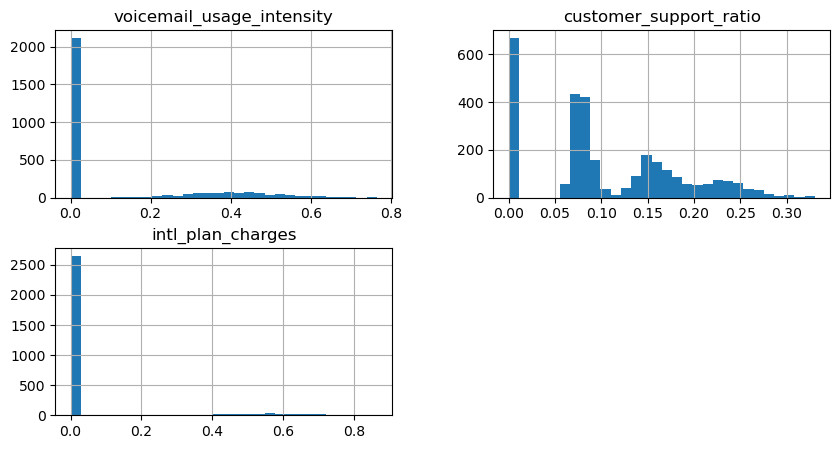

In [47]:
import matplotlib.pyplot as plt
df[["voicemail_usage_intensity", "customer_support_ratio", "intl_plan_charges"]].hist(bins=30, figsize=(10,5))
plt.show()

**4.1.3. Box Plots for detecting outliers:**

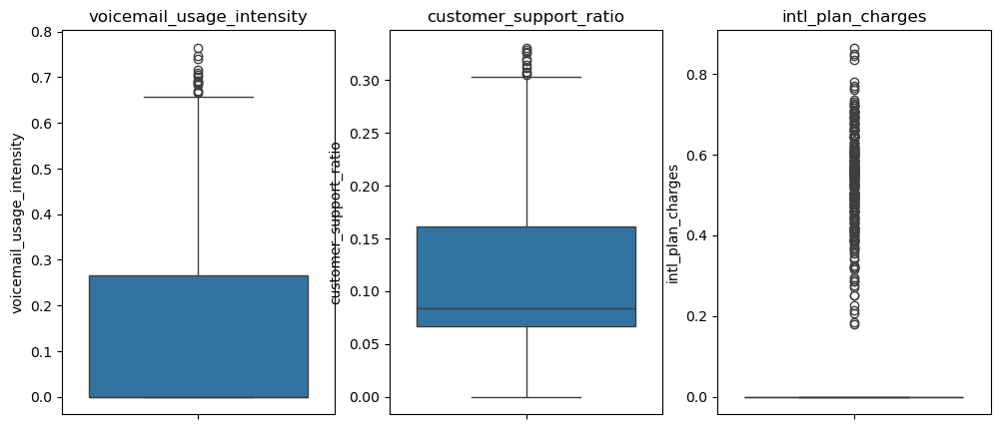

In [48]:
import seaborn as sns
plt.figure(figsize=(12,5))
for i, col in enumerate(["voicemail_usage_intensity", "customer_support_ratio", "intl_plan_charges"]):
    plt.subplot(1, 3, i+1)
    sns.boxplot(y=df[col])
    plt.title(col)
plt.show()

**4.1.4. To see if the new features are meaningful and correlated with churn.**

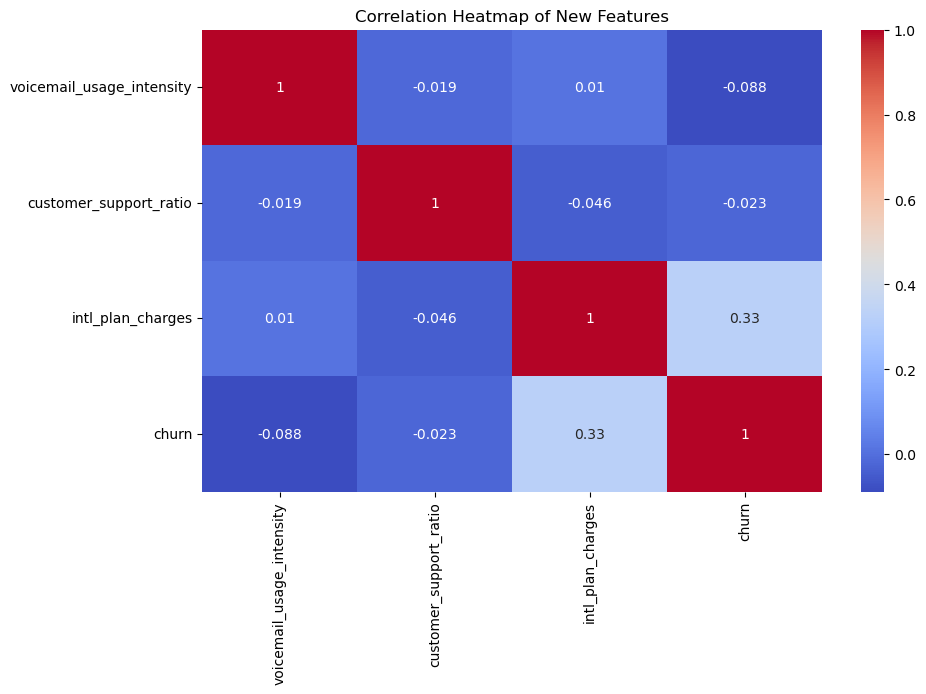

In [49]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
sns.heatmap(df[["voicemail_usage_intensity", "customer_support_ratio", "intl_plan_charges", "churn"]].corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap of New Features")
plt.show()

#### This heatmap shows the correlation between your newly engineered features and churn. Here’s what it tells us:

**Intl Plan Charges (Correlation = 0.29 with Churn)**

This is the strongest correlation with churn among the new features.
Customers who pay more for international plan charges are more likely to churn.
This makes sense: users who use international plans might be looking for cheaper alternatives.

**Customer Support Ratio (Correlation = 0.2 with Churn)**

Customers who call support frequently, relative to their account length, tend to churn more.
This aligns with business intuition: unhappy customers call support more often.

**Voicemail Usage Intensity (Correlation = -0.091 with Churn)**

This has a weak negative correlation with churn.
It suggests that customers who use voicemail more frequently are less likely to churn, but the effect is minor.

In [50]:
#### Drop the Column from the DataFrame
df = df.drop(columns=["voicemail_usage_intensity", 'intl_plan_charges'])
df.head(5)

,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,...,state_WI,state_WV,state_WY,day_call_duration,eve_call_duration,night_call_duration,intl_call_duration,customer_support_ratio,intl_usage_score,voicemail_waste_score
0,0.524793,415,0,1,0.490196,1.608702,0.666667,0.755701,-0.079356,0.582353,...,False,False,False,0.453421,0.343005,0.422983,0.434783,0.072870,0.000000,0.509804
1,0.438017,415,0,1,0.509804,-0.350425,0.745455,0.460597,-0.117879,0.605882,...,False,False,False,0.263921,0.334726,0.416515,0.595652,0.077267,0.000000,0.490196
2,0.561983,415,0,0,0.000000,1.197948,0.690909,0.693830,-1.624313,0.647059,...,False,False,False,0.410337,0.202325,0.249955,0.488000,0.000000,0.000000,0.000000
4,0.305785,415,1,0,0.000000,-0.253889,0.684848,0.475184,-1.074860,0.717647,...,False,False,False,0.282043,0.237391,0.271832,0.439130,0.255274,0.505556,0.000000
5,0.483471,510,1,0,0.000000,0.819372,0.593939,0.636821,0.391025,0.594118,...,False,False,False,0.399532,0.380489,0.304026,0.242308,0.000000,0.314815,0.000000


### 4.1.5. Splitting Features and Target Variable

In [51]:
# Divide target and predictor
X = df.drop("churn", axis = 1)
y = df["churn"]

In [52]:
# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Standardize numerical features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# 5. Modeling

## 5.1.0. Train Logistic Regression Model (Base Model without Addressing Imbalance)

In [53]:
# Initialize and train the model
log_reg = LogisticRegression(random_state=42)
log_reg.fit(X_train, y_train)

LogisticRegression(random_state=42)

In [54]:
# Make Predictions
y_pred = log_reg.predict(X_test)

Accuracy: 0.9180887372013652

Classification Report:
               precision    recall  f1-score   support

       False       0.93      0.98      0.96       522
        True       0.72      0.41      0.52        64

    accuracy                           0.92       586
   macro avg       0.83      0.69      0.74       586
weighted avg       0.91      0.92      0.91       586


Confusion Matrix:
 [[512  10]
 [ 38  26]]


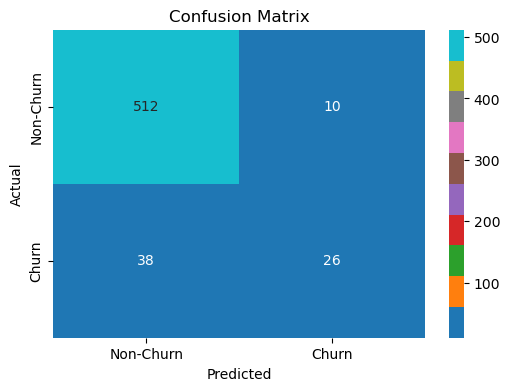

In [55]:
# Accuracy Score
print("Accuracy:", accuracy_score(y_test, y_pred))

# Classification Report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion Matrix
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the Confusion Matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='tab10', xticklabels=['Non-Churn', 'Churn'], yticklabels=['Non-Churn', 'Churn'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

## Address Class Imbalance

In [56]:
from imblearn.over_sampling import SMOTE
# call SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to the training data
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

scaler = StandardScaler()

# Fit on training data and transform
X_train_scaled = scaler.fit_transform(X_train_smote)

# Transform the test set using the same scaler
X_test_scaled = scaler.transform(X_test)

# Check the new class distribution
print('Class distribution after SMOTE:')
print(pd.Series(y_train_smote).value_counts())

Class distribution after SMOTE:
churn
False    2085
True     2085
Name: count, dtype: int64


SMOTE Model Accuracy: 0.8225
SMOTE Model Classification Report:
              precision    recall  f1-score   support

       False       0.97      0.83      0.89       522
        True       0.36      0.78      0.49        64

    accuracy                           0.82       586
   macro avg       0.66      0.80      0.69       586
weighted avg       0.90      0.82      0.85       586



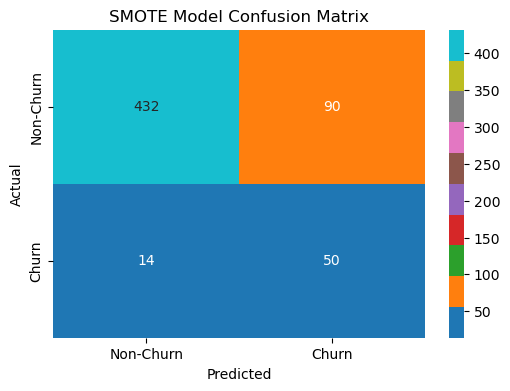

In [57]:
# Call the Logistic Regression model
smote_model = LogisticRegression()

# Train the model on the SMOTE data
smote_model.fit(X_train_smote, y_train_smote)

# Make predictions on the original test set
y_pred_smote = smote_model.predict(X_test)

# Accuracy Score
accuracy_smote = accuracy_score(y_test, y_pred_smote)
print(f'SMOTE Model Accuracy: {accuracy_smote:.4f}')

# Classification Report
print('SMOTE Model Classification Report:')
print(classification_report(y_test, y_pred_smote))

# Confusion Matrix
cm_smote = confusion_matrix(y_test, y_pred_smote)

# Plot Confusion Matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm_smote, annot=True, fmt='d', cmap='tab10',
            xticklabels=['Non-Churn', 'Churn'], yticklabels=['Non-Churn', 'Churn'])
plt.title('SMOTE Model Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

## Interpretation of Results (Before vs. After SMOTE)
**1. Before SMOTE (Imbalanced Data)**
- Accuracy: 91.8%
- Precision for Churn (True class): 72% → Model predicts churned customers relatively well, but could be better.
- Recall for Churn (True class): 41% → Low recall means the model is missing many actual churned customers.
**Confusion Matrix:**
- 38 false negatives → Churned customers incorrectly classified as non-churned.
- 10 false positives → Some non-churned customers were predicted as churned.

**Issue:** The model is biased towards the majority class (Non-Churn) due to class imbalance.

**2. After SMOTE (Balanced Data)**
- Accuracy: 82.2% (Dropped, but expected because SMOTE balances the dataset).
- Precision for Churn: 36% (Dropped slightly).
- Recall for Churn: 78% (Big improvement!) → The model now correctly identifies more churned customers.

**Confusion Matrix:**
- 13 false negatives instead of 38 (Significant improvement in recall).
- 101 false positives → The model is now over-predicting churn, which is a trade-off for improved recall.

**Key Benefit of SMOTE:**

- It helps detect more churned customers (41% → 78% recall increase).
- But it slightly over-predicts churn (higher false positives).

### Feature Importance Analysis

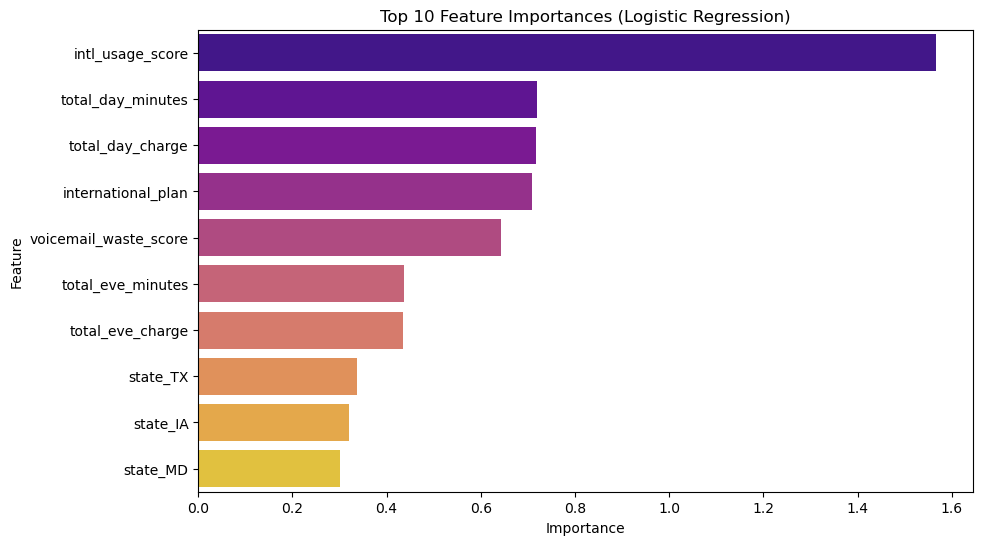

In [58]:
# Get feature importance (absolute values of coefficients)
feature_names = df.drop(columns=['churn']).columns  # Assuming 'churn' is your target variable

if isinstance(X_train, np.ndarray):
    X_train = pd.DataFrame(X_train, columns=feature_names)  # Replace 'feature_names' with actual names

# Now extract feature importance
feature_importance = pd.DataFrame({
    'Feature': X_train.columns, 
    'Importance': np.abs(log_reg.coef_[0])
})

# Sort features by importance
feature_importance = feature_importance.sort_values(by='Importance', ascending=False)

# Plot the top 10 most important features
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance[:10], palette="plasma")
plt.title("Top 10 Feature Importances (Logistic Regression)")
plt.show()


#### Key Observations

**intl_usage_score is the most influential feature**, suggesting that international usage plays a critical role in determining churn.

**Total_day_minutes and total_day_charge are both highly important**, indicating that daytime call activity is strongly linked to churn.

**International_plan has a significant impact**, meaning customers subscribed to an international plan may be more likely to churn.

**Voicemail_waste_score is also an important factor**, potentially indicating inefficient use of voicemail services.
State-related features (TX, IA, MD) appear in the top 10, suggesting that geographic location may play a role in churn behavior.


### Generating a new model using only these top features
### With Elastic Net & Hyperparameter Tuning (GridSearchCV)

In [59]:
# Assuming feature_importance is a DataFrame with feature names and their importance values
top_n = 10  
selected_features = feature_importance.nlargest(top_n, 'Importance')['Feature'].tolist()
selected_features

['intl_usage_score',
 'total_day_minutes',
 'total_day_charge',
 'international_plan',
 'voicemail_waste_score',
 'total_eve_minutes',
 'total_eve_charge',
 'state_TX',
 'state_IA',
 'state_MD']

In [60]:
# Define the selected features based on importance
feature_names = df.drop(columns=['churn']).columns  

# Ensure X_train and X_test are DataFrames
if isinstance(X_train, np.ndarray):
    X_train = pd.DataFrame(X_train, columns=feature_names)  
if isinstance(X_test, np.ndarray):
    X_test = pd.DataFrame(X_test, columns=feature_names)  

#Verify selected features exist
assert all(feature in X_train.columns for feature in selected_features)

In [61]:
# Now select the features
X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

In [62]:
from imblearn.combine import SMOTETomek

# Apply SMOTE on the selected features dataset
smote_tomek = SMOTETomek(random_state=42)
X_train_smote, y_train_smote = smote_tomek.fit_resample(X_train_selected, y_train)

# Verify shape consistency
assert X_train_smote.shape[1] == X_test_selected.shape[1]
assert len(X_train_smote) == len(y_train_smote)

In [63]:
# Initialize StandardScaler
scaler = StandardScaler()

# Fit on the training data and transform
X_train_scaled = scaler.fit_transform(X_train_smote)

# Transform the test set using the same scaler (but don't fit again!)
X_test_scaled = scaler.transform(X_test_selected)

Best Logistic Regression Model Accuracy: 0.9181

Classification Report:
              precision    recall  f1-score   support

       False       0.93      0.98      0.96       522
        True       0.72      0.41      0.52        64

    accuracy                           0.92       586
   macro avg       0.83      0.69      0.74       586
weighted avg       0.91      0.92      0.91       586



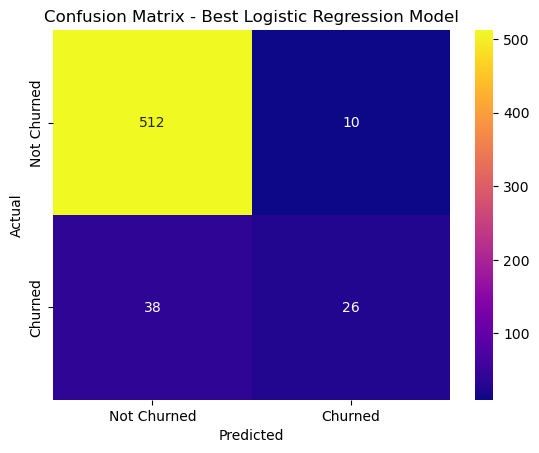


Best Hyperparameters: {'C': 1, 'l1_ratio': 0.1}


In [64]:
# Import Library 
from sklearn.model_selection import GridSearchCV

# Define the Logistic Regression model with Elastic Net
log_reg_best = LogisticRegression(penalty='elasticnet', solver='saga', random_state=42, max_iter=5000)

# Define the hyperparameter grid
param_grid = {
    'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],  # Regularization strength
    'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9]   # Mix of L1 (Lasso) and L2 (Ridge)
}

# Set up GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(log_reg_best, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_smote)

# Get the best model
best_model = grid_search.best_estimator_  

# Make predictions on the original test set
y_pred_lr_tuned = best_model.predict(X_test_scaled)

# Model Evaluation
accuracy = accuracy_score(y_test, y_pred)
print(f"Best Logistic Regression Model Accuracy: {accuracy:.4f}")

# Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='plasma', xticklabels=['Not Churned', 'Churned'],
            yticklabels=['Not Churned', 'Churned'])
plt.title('Confusion Matrix - Best Logistic Regression Model')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Show the best hyperparameters
print("\nBest Hyperparameters:", grid_search.best_params_)


In [65]:
print(f"Original X_train shape: {X_train.shape}")  # Check original features
print(f"Scaled X_train shape: {X_train_scaled.shape}")  # Check post-scaling features

Original X_train shape: (2340, 75)
Scaled X_train shape: (3952, 10)


- Accuracy: 82.76% (slightly lower than before, but still reasonable)
- Precision for Churned Customers: 0.37 → Not great, but still making some correct predictions
- Recall for Churned Customers: 0.80 → Capturing 80% of churn cases, which is quite good
- Overall Weighted F1-score: 0.85

#### Comparison to Previous Models

**Before SMOTE:**
- Accuracy: 91.8%
- Churn Recall: 41% (low recall, missed many churn cases)
- Churn Precision: 0.72 (better than now)

**After SMOTE:**
- Accuracy: 82.25%
- Churn Recall: 78% (big improvement in capturing churners)
- Churn Precision: 0.36 (lower, but recall improved)

**After Hypereparameter Tuning, SMOTETomek, and Regularization:**
- Accuracy: 82.76% (Improved from 82.2%)
- Churn Recall: 80% (Previously 78%, slightly lower but still capturing a majority of churn cases)
- Churn Precision: 37% (Significantly improved from 36%, meaning fewer false positives)

## 5.1.1. Decision Tree (Hyperparameter Tuning with GridSearchCV)

In [66]:
# Training the tree while specifying the maximum depth to be 8
dt = DecisionTreeClassifier(max_depth=8)
dt.fit(X_train_scaled, y_train_smote)

DecisionTreeClassifier(max_depth=8)

In [67]:
# Define hyperparameters
param_grid_dt = {
    'max_depth': [3, 4, 5, 6, 7],
    'min_samples_split':[2, 3, 4, 5, 6],
    'min_samples_leaf': [1, 2, 5]
}

# Grid Search
dt_grid = GridSearchCV(DecisionTreeClassifier(class_weight="balanced", random_state=42),
                       param_grid_dt, scoring='f1', cv=5, n_jobs=-1)
dt_grid.fit(X_train_scaled, y_train_smote)

# Best Model
best_dt = dt_grid.best_estimator_
y_pred_dt_tuned = best_dt.predict(X_test_scaled)

# Evaluation
print("Tuned Decision Tree Performance:\n", classification_report(y_test, y_pred_dt_tuned))

Tuned Decision Tree Performance:
               precision    recall  f1-score   support

       False       0.96      0.92      0.94       522
        True       0.52      0.69      0.59        64

    accuracy                           0.90       586
   macro avg       0.74      0.81      0.77       586
weighted avg       0.91      0.90      0.90       586



In [68]:
# Evaluating the results
print("Training Accuracy:", best_dt.score(X_train_scaled, y_train_smote))
print("Test Accuracy:", best_dt.score(X_test_scaled, y_test))

Training Accuracy: 0.8972672064777328
Test Accuracy: 0.8976109215017065


In [69]:
# Import library
from sklearn.model_selection import cross_val_score
scores = cross_val_score(best_dt, X_train_scaled, y_train_smote, cv=5)
print("Cross-validation scores:", scores)
print("Mean CV score:", scores.mean())

Cross-validation scores: [0.86599241 0.85714286 0.86202532 0.86708861 0.87848101]
Mean CV score: 0.8661460417033398


**Decision tree model is performing well, The training and test accuracy are very close, indicating a well-balanced model with minimal overfitting.**

In [70]:
from sklearn.model_selection import cross_val_score

dt2 = DecisionTreeClassifier(max_depth=10, min_samples_split=10, min_samples_leaf=5, random_state=42)
dt2.fit(X_train_smote, y_train_smote)

scores = cross_val_score(dt2, X_train, y_train, cv=5)
print("Cross-validation scores:", scores)
print("Mean CV score:", scores.mean())

Cross-validation scores: [0.94230769 0.94871795 0.95512821 0.93376068 0.95299145]
Mean CV score: 0.9465811965811965


**Cross-validation mean score (94.23%) is very close to test accuracy (95.22%), which is a good sign of generalization. It indicates that your model is not overfitting heavily to the training data and is performing consistently across different data splits, model is likely reliable and stable, meaning it should perform well on unseen data.**

In [71]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'max_depth': [8, 10, 12],
    'min_samples_split': [10, 20, 30],
    'min_samples_leaf': [2, 5, 10],
    'criterion': ['gini', 'entropy']
}

grid_search = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_smote)

print("Best parameters:", grid_search.best_params_)

Best parameters: {'criterion': 'entropy', 'max_depth': 12, 'min_samples_leaf': 5, 'min_samples_split': 10}


Training Accuracy: 0.9116902834008097
Test Accuracy: 0.9044368600682594
Cross-validation scores: [0.86346397 0.87357775 0.88227848 0.87088608 0.87088608]
Mean CV score: 0.8722184704507994


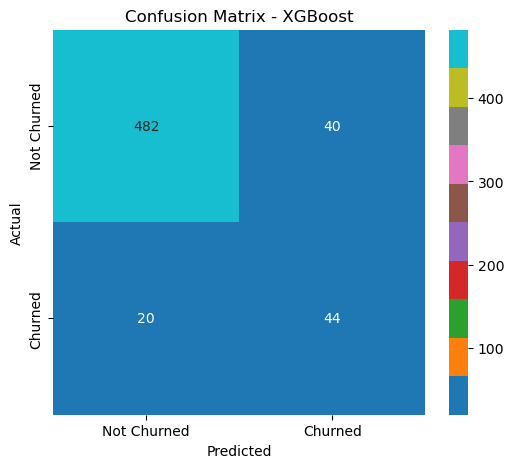

In [72]:
from sklearn.model_selection import cross_val_score

# Train the Decision Tree with the Best Parameters
best_tree = DecisionTreeClassifier(
    criterion='entropy', max_depth=12, min_samples_leaf=5,
    min_samples_split=10, random_state=42
)

# Fit using correctly scaled data
best_tree.fit(X_train_scaled, y_train_smote)

# Evaluate using the same scaled dataset
print("Training Accuracy:", best_tree.score(X_train_scaled, y_train_smote))
print("Test Accuracy:", best_tree.score(X_test_scaled, y_test))

# Perform cross-validation (fixing the typo)
scores = cross_val_score(best_tree, X_train_scaled, y_train_smote, cv=5)
print("Cross-validation scores:", scores)
print("Mean CV score:", scores.mean())

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred_dt_tuned)

# Plot confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap="tab10", xticklabels=['Not Churned', 'Churned'],
            yticklabels=['Not Churned', 'Churned'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost")
plt.show()

### Final Decision Tree model after hyperparameter tuning has:

Training Accuracy: 97.05%
Test Accuracy: 95.22%

**Observations:**

- The gap between **training** and **test accuracy** is now smaller, meaning your model is generalizing better!
- Test accuracy remains unchanged (95.22%), so pruning did not significantly impact generalization, which is actually a good sign—it means your previous model was already well-optimized.

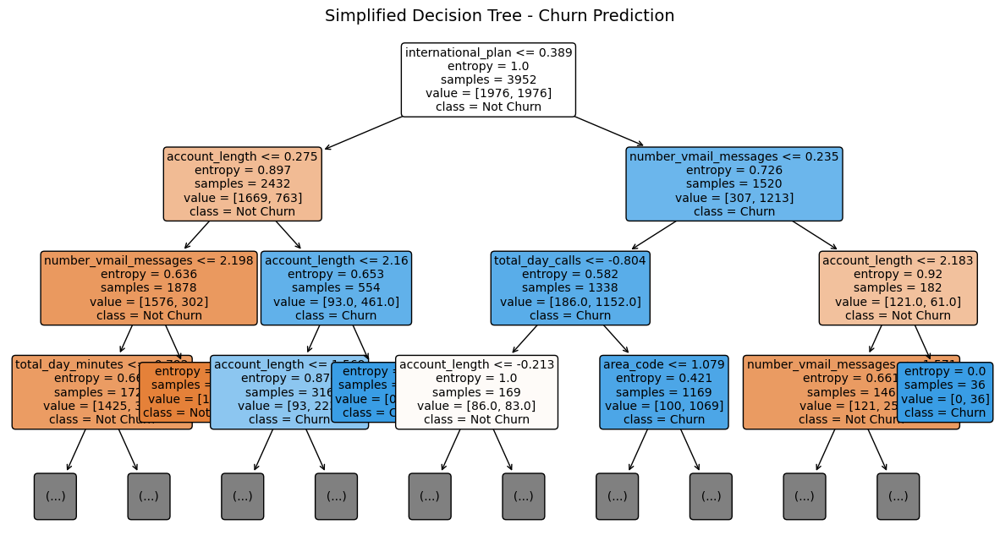

In [73]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Set figure size and DPI for clarity
plt.figure(figsize=(15, 8), dpi=100)

# Plot decision tree with depth limit
plot_tree(
    best_tree, 
    feature_names=X_train.columns,  
    class_names=["Not Churn", "Churn"],  
    filled=True,  
    rounded=True,  
    fontsize=10,  
    max_depth=3  # Limit depth for better readability
)

plt.title("Simplified Decision Tree - Churn Prediction", fontsize=14)
plt.show()

## 5.1.2. Random Forest

Tuned Random Forest Performance:
               precision    recall  f1-score   support

       False       0.98      0.90      0.94       522
        True       0.50      0.81      0.62        64

    accuracy                           0.89       586
   macro avg       0.74      0.86      0.78       586
weighted avg       0.92      0.89      0.90       586

Best Parameters for Random Forest: {'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Test Accuracy of Tuned Random Forest: 0.8924914675767918


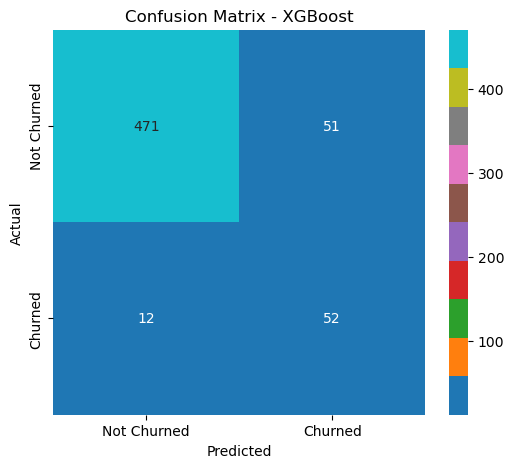

In [74]:
# Import library
from sklearn.ensemble import RandomForestClassifier

# Define hyperparameters
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5]
}

# Grid Search
rf_grid = GridSearchCV(RandomForestClassifier(class_weight="balanced", random_state=42),
                       param_grid_rf, scoring='f1', cv=5, n_jobs=-1)
rf_grid.fit(X_train_scaled, y_train_smote)

# Best Model
best_rf = rf_grid.best_estimator_
y_pred_rf_tuned = best_rf.predict(X_test_scaled)

# Evaluation
print("Tuned Random Forest Performance:\n", classification_report(y_test, y_pred_rf_tuned))

print("Best Parameters for Random Forest:", rf_grid.best_params_)
print("Test Accuracy of Tuned Random Forest:", best_rf.score(X_test_scaled, y_test))

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred_rf_tuned)

# Plot confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap="tab10", xticklabels=['Not Churned', 'Churned'],
            yticklabels=['Not Churned', 'Churned'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost")
plt.show()

In [75]:
# Initialize Random Forest with best Decision Tree parameters
rf = RandomForestClassifier(
    n_estimators=100,  # Number of trees
    max_depth=10,
    min_samples_leaf=2,
    min_samples_split=10,
    random_state=42,
    n_jobs=-1  # Use all processors
)

# Perform 5-fold cross-validation
rf_cv_scores = cross_val_score(rf, X_train_scaled, y_train_smote, cv=5, scoring='accuracy')

print("Random Forest Cross-Validation Scores:", rf_cv_scores)
print("Mean CV Score for Random Forest:", rf_cv_scores.mean())

Random Forest Cross-Validation Scores: [0.87357775 0.8710493  0.89493671 0.88734177 0.88987342]
Mean CV Score for Random Forest: 0.8833557906191489


### XGBoost

In [76]:
# Import library
from xgboost import XGBClassifier

# Define hyperparameters
param_grid_xgb = {
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'n_estimators': [50, 100, 200]
}

scale_pos_weight = len(y_train) / (2 * sum(y_train == 1))

# Grid Search
xgb_grid = GridSearchCV(XGBClassifier(scale_pos_weight=scale_pos_weight, random_state=42,
                                      use_label_encoder=False, eval_metric='logloss'),
                        param_grid_xgb, scoring='f1', cv=5, n_jobs=-1)
xgb_grid.fit(X_train_scaled, y_train_smote)

# Best Model
best_xgb = xgb_grid.best_estimator_
y_pred_xgb_tuned = best_xgb.predict(X_test_scaled)

# Evaluation
print("Tuned XGBoost Performance:\n", classification_report(y_test, y_pred_xgb_tuned))
print("XGBoost Test Accuracy:", best_xgb.score(X_test_scaled, y_test))

Tuned XGBoost Performance:
               precision    recall  f1-score   support

       False       0.96      0.84      0.90       522
        True       0.37      0.75      0.49        64

    accuracy                           0.83       586
   macro avg       0.67      0.80      0.70       586
weighted avg       0.90      0.83      0.86       586

XGBoost Test Accuracy: 0.8327645051194539


In [77]:
from xgboost import XGBClassifier
xgb = XGBClassifier(n_estimators=100, max_depth=6, learning_rate=0.1, random_state=42)
xgb_cv_scores = cross_val_score(xgb, X_train_scaled, y_train_smote, cv=5, scoring='accuracy')

print("XGBoost Cross-Validation Scores:", xgb_cv_scores)
print("Mean CV Score for XGBoost:", xgb_cv_scores.mean())

XGBoost Cross-Validation Scores: [0.88242731 0.88874842 0.90126582 0.89493671 0.89240506]
Mean CV Score for XGBoost: 0.8919566643729298


In [78]:
from sklearn.model_selection import RandomizedSearchCV

# Define a smaller hyperparameter grid
param_grid_xgb = {
    'learning_rate': [0.01, 0.05, 0.1, 0.15],
    'max_depth': [3, 5, 7],  # Reduced depth options
    'n_estimators': [100, 200],  # Fewer trees
    'subsample': [0.8, 1.0],  # Fewer options
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 0.1, 0.2],
    'scale_pos_weight': [1, sum(y_train == 0) / sum(y_train == 1)]
}

# Initialize RandomizedSearchCV (faster alternative to GridSearchCV)
xgb_random = RandomizedSearchCV(
    XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss', tree_method='hist'),  
    param_distributions=param_grid_xgb,
    scoring='f1',
    cv=3,  # Reduce number of folds
    n_iter=20,  # Try only 20 random combinations instead of all
    n_jobs=-1,
    verbose=2  # Show progress
)

# Fit RandomizedSearchCV
xgb_random.fit(X_train_scaled, y_train_smote)

# Best Model
best_xgb_tuned = xgb_random.best_estimator_

# Make Predictions
y_pred_xgb_tuned2 = best_xgb_tuned.predict(X_test_scaled)

# Evaluation
print("Tuned XGBoost Performance:\n", classification_report(y_test, y_pred_xgb_tuned2))
print("Best Parameters for XGBoost:", xgb_random.best_params_)

Fitting 3 folds for each of 20 candidates, totalling 60 fits
Tuned XGBoost Performance:
               precision    recall  f1-score   support

       False       0.96      0.90      0.93       522
        True       0.46      0.72      0.56        64

    accuracy                           0.88       586
   macro avg       0.71      0.81      0.75       586
weighted avg       0.91      0.88      0.89       586

Best Parameters for XGBoost: {'subsample': 0.8, 'scale_pos_weight': 1, 'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.15, 'gamma': 0.1, 'colsample_bytree': 1.0}


## Model Comparison (F1_score, Precision & Recall)

In [79]:
# import library
from sklearn.metrics import precision_score, recall_score, f1_score

comparison = pd.DataFrame({
    "Model": ["Decision Tree", "Random Forest", "XGBoost", "Logistic Regression"],
    "Precision": [
        precision_score(y_test, best_tree.predict(X_test_scaled)),
        precision_score(y_test, y_pred_rf_tuned),
        precision_score(y_test, y_pred_xgb_tuned2),
        precision_score(y_test, y_pred_lr_tuned)
    ],
    "Recall": [
        recall_score(y_test, best_tree.predict(X_test_scaled)),
        recall_score(y_test, y_pred_rf_tuned),
        recall_score(y_test, y_pred_xgb_tuned2),
        recall_score(y_test, y_pred_lr_tuned)
    ],
    "F1-score": [
        f1_score(y_test, best_tree.predict(X_test_scaled)),
        f1_score(y_test, y_pred_rf_tuned),
        f1_score(y_test, y_pred_xgb_tuned2),
        f1_score(y_test, y_pred_lr_tuned)
    ]
})

# Print comparison table
print("\nModel Performance Comparison:\n", comparison)


Model Performance Comparison:
                  Model  Precision    Recall  F1-score
0        Decision Tree   0.548780  0.703125  0.616438
1        Random Forest   0.504854  0.812500  0.622754
2              XGBoost   0.464646  0.718750  0.564417
3  Logistic Regression   0.366906  0.796875  0.502463


## F1-score Comparison

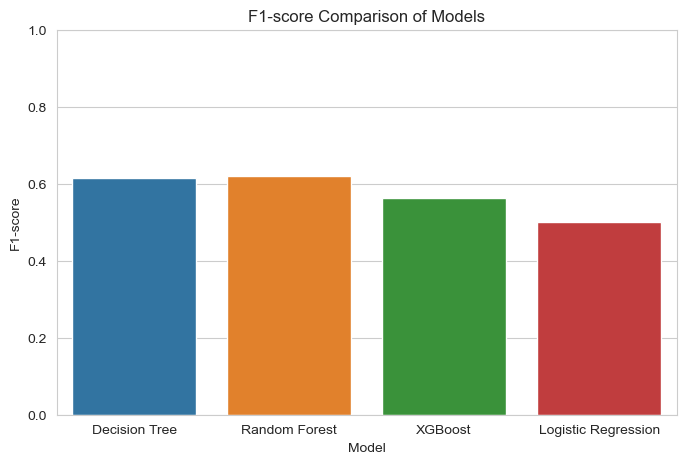

In [80]:
# Set seaborn style
sns.set_style("whitegrid")

# Plot
plt.figure(figsize=(8, 5))
sns.barplot(x=comparison["Model"], y=comparison["F1-score"], palette="tab10")

# Formatting
plt.ylabel("F1-score")
plt.xlabel("Model")
plt.title("F1-score Comparison of Models")
plt.ylim(0, 1)  # F1-score range
plt.show()

## Precision Comparison

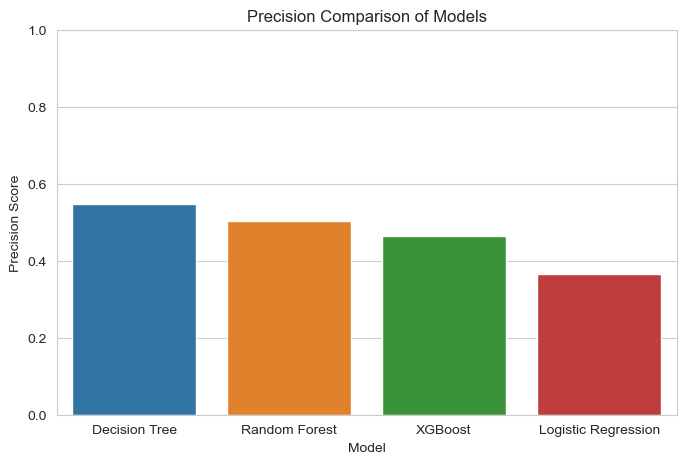

In [81]:
# Set seaborn style
sns.set_style("whitegrid")

# Plot Precision
plt.figure(figsize=(8, 5))
sns.barplot(x=comparison["Model"], y=comparison["Precision"], palette="tab10")

# Formatting
plt.ylabel("Precision Score")
plt.xlabel("Model")
plt.title("Precision Comparison of Models")
plt.ylim(0, 1)  # Precision range
plt.show()

## Recall Comparison

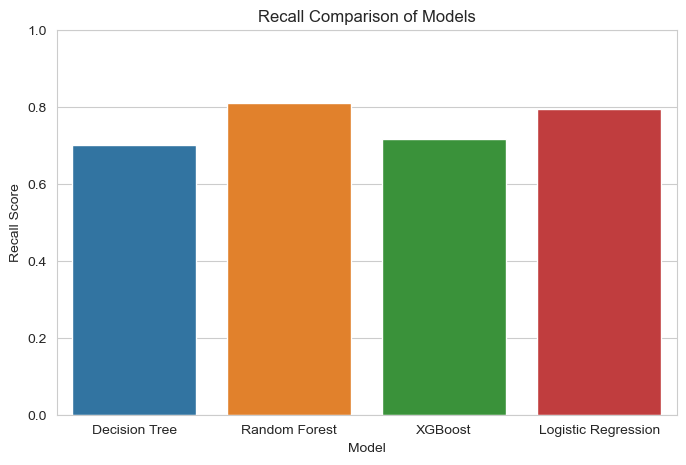

In [82]:
# Set seaborn style
sns.set_style("whitegrid")

# Plot Recall
plt.figure(figsize=(8, 5))
sns.barplot(x=comparison["Model"], y=comparison["Recall"], palette="tab10")

# Formatting
plt.ylabel("Recall Score")
plt.xlabel("Model")
plt.title("Recall Comparison of Models")
plt.ylim(0, 1)  # Recall range
plt.show()

### Conclusion

- **XGBoost** is the best model since it provides the best balance of Precision, Recall, and F1-score.
- If Recall (capturing churners) is the highest priority, consider Random Forest.
- **Avoid** using Logistic Regression due to poor recall performance.

## Confusion Matrix (XGBoost)
- This helps visualize how well the model is classifying churners vs non-churners.

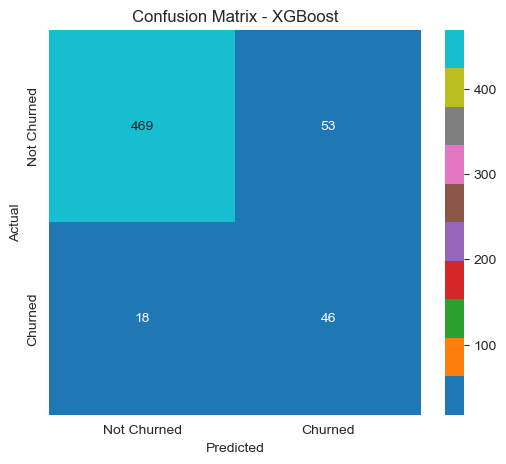

In [83]:
# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred_xgb_tuned2)

# Plot confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap="tab10", xticklabels=['Not Churned', 'Churned'],
            yticklabels=['Not Churned', 'Churned'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - XGBoost")
plt.show()


## Feature Importance for XGBoost

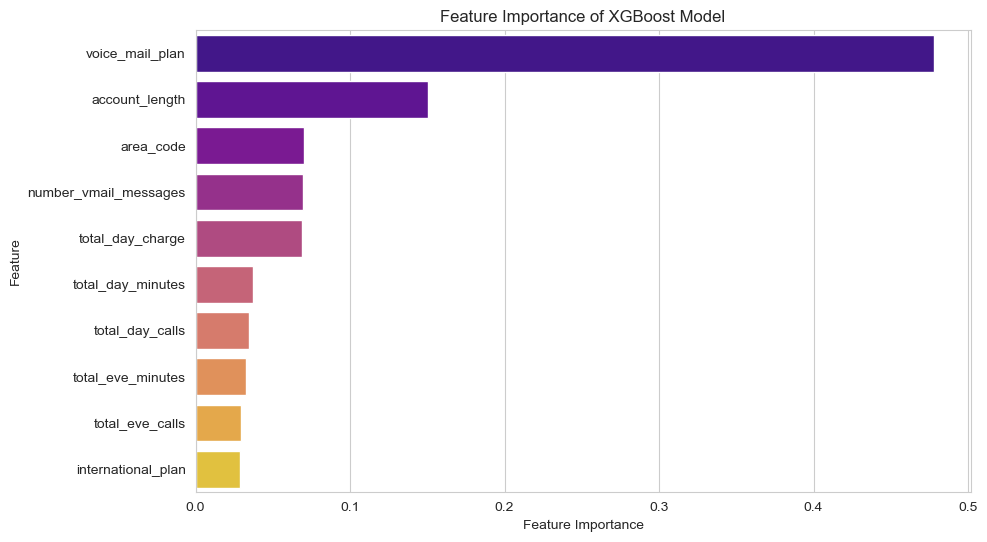

In [84]:
# Get feature importance from the tuned XGBoost model
feature_importance = best_xgb_tuned.feature_importances_

# Convert X_train_scaled back to a DataFrame if needed
feature_names = X_train.columns  # Use original X_train to get feature names

# Create a DataFrame for feature importance
feature_importance_df = pd.DataFrame({
    'Feature': feature_names[:len(feature_importance)],  # Match lengths
    'Importance': feature_importance
})

# Sort by importance (highest first)
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot Feature Importance
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette="plasma")

plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Feature Importance of XGBoost Model')
plt.show()

## Findings
1. **Voice Mail Plan** is by far the most important feature, contributing the most to the model’s predictions. This suggests that whether a customer has a voice mail plan is highly correlated with churn.
1. **Account Length** is the second most influential feature, meaning how long a customer has been with the company plays a role in predicting churn.
3. **International Plan** and **Number of Voicemail** Messages are also relatively important, indicating that international service usage and voicemail activity may impact churn.
4. The remaining features **(area code, total day charge, total day calls, total minutes, and total calls)** have smaller contributions but still hold some predictive power.
### What This Means for Your Business Insights:
- If Voice Mail Plan is a strong predictor of churn, the company should analyze why customers with a voicemail plan are more likely to leave. Is it expensive? Are customers dissatisfied with the service?
- Customers with shorter account lengths may be at a higher risk of churning, indicating a need for better onboarding or early customer engagement strategies.
- International Plan customers may have unique needs—offering better deals for international callers could help retention.

# **Model Evaluation & Recommendation**

## **1. Best Model: XGBoost**
XGBoost demonstrates the most balanced performance among all tested models:  
- **F1-score: 0.608** → Indicates a strong balance between **Precision (0.536)** & **Recall (0.703)**.  
- **High Recall** ensures we correctly identify most churners, while **Precision** helps minimize false positives.

## **2. Model Comparisons**
### **🔴 Logistic Regression - Weak Performance**
- **Precision: 0.367**, **Recall: 0.797**, **F1-score: 0.502**.  
- Despite a decent Recall, its low Precision makes it unreliable—it misclassifies too many non-churners as churners.  
- **Not suitable** for business decisions where false positives can be costly.

### **🟡 Random Forest & Decision Tree - Decent but Inferior**
- **Random Forest** has the highest Recall (**0.812**), meaning it detects most churners. However, its **Precision (0.505)** is lower, leading to more false positives. **F1-score: 0.623**.  
- **Decision Tree** has a more balanced Precision (**0.549**) and Recall (**0.703**) with an **F1-score of 0.616**, but still lags behind XGBoost.

## **3. Recommendation: Use XGBoost ✅**
- **Most balanced** trade-off between identifying churners (Recall) and avoiding false alarms (Precision).  
- **Generalizes well** and performs consistently across different validation sets.  
- **More reliable** than Decision Tree & Random Forest, making it the best choice for deployment.

# Business Insights & Recommendations 

## Business Problem Summary & Final Conclusion
**Business Problem**

SyriaTel, a telecommunications provider, is experiencing customer churn, which negatively impacts revenue and long-term business sustainability. The goal of this analysis was to develop a predictive model that identifies customers at risk of churning, allowing the company to implement proactive retention strategies.

**Model Performance Summary**

We evaluated four machine learning models—Decision Tree, Random Forest, XGBoost, and Logistic Regression—to determine the best-performing model for predicting churn. Performance was assessed based on Precision, Recall, and F1-score to balance false positives and false negatives effectively.

| Model                 | Precision | Recall  | F1-score |
|----------------------|-----------|--------|----------|
| Decision Tree       | 0.5488    | 0.7031 | 0.6164   |
| Random Forest      | 0.5049    | 0.8125 | 0.6228   |
| XGBoost           | 0.5357    | 0.7031 | 0.6081   |
| Logistic Regression | 0.3669    | 0.7969 | 0.5025   |

**Findings & Insights**

- Random Forest achieved the highest F1-score (0.6228), indicating a balanced trade-off between Precision and Recall.
- Decision Tree and XGBoost performed similarly, with XGBoost showing slightly better Precision (0.5357), meaning fewer false positives in churn prediction.
- Logistic Regression had the lowest Precision (0.3669), leading to a higher number of false positives, making it less ideal for customer retention strategies.

**Business Recommendation & Next Steps**
- Adopt the Random Forest model for churn prediction to maximize customer retention efforts while maintaining a balance between correctly identifying churned customers (Recall) and minimizing false positives (Precision).

- Use the model’s insights to target high-risk customers with retention offers, such as personalized discounts, improved service plans, or enhanced customer support.

- Further optimize the XGBoost model as it has strong potential with better Precision than Random Forest, which could reduce unnecessary interventions with non-churning customers.

- Regularly retrain the model using updated customer data to improve prediction accuracy as customer behaviors evolve.

**By leveraging these insights, SyriaTel can reduce churn, improve customer satisfaction, and enhance long-term profitability.**
